In [1]:
import os
import requests
from tqdm import tqdm
import zipfile
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch.optim.lr_scheduler import ReduceLROnPlateau

import torchvision.transforms as transforms
from scipy.signal import welch, find_peaks
from scipy.linalg import hankel, eigh
from sklearn.decomposition import FastICA
from PIL import Image
import matplotlib.pyplot as plt
from IPython import display as disp
from scipy.fftpack import fft, ifft  # Correct way
import warnings
from sklearn.cross_decomposition import CCA

from scipy.signal import butter, filtfilt
from scipy.signal import detrend

import pandas as pd

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print('Imports complete.')

Imports complete.


In [2]:
import zipfile

# get the dataset:
if os.path.isdir('motion-artifact-data'):
    print ("Dataset has already been downloaded...")
else:

    # make directory if it doesn't exist
    directory = 'motion-artifact-data'
    if not os.path.exists(directory):
        os.makedirs(directory)

        # unzipping
        with zipfile.ZipFile('motion-artifact-contaminated-fnirs-and-eeg-data-1.0.0.zip', 'r') as zip_ref:
            zip_ref.extractall(directory)
            print(f"Files unzipped successfully in the '{directory}' directory!")

        

Dataset has already been downloaded...


In [3]:
# get the dataset:
if os.path.isdir('motion-artifact-data/EEG-csv'):
    print ("Dataset has already been downloaded...")
else:

    # make directory if it doesn't exist
    directory = 'motion-artifact-data/EEG-csv'
    if not os.path.exists(directory):
        os.makedirs(directory)

        # unzipping
        with zipfile.ZipFile('motion-artifact-data/motion-artifact-contaminated-fnirs-and-eeg-data-1.0.0/EEG-csv.zip', 'r') as zip_ref:
            zip_ref.extractall(directory)
            print(f"Files unzipped successfully in the '{directory}' directory!")

        # remove the zip file after extraction
        os.remove('motion-artifact-data/motion-artifact-contaminated-fnirs-and-eeg-data-1.0.0/EEG-csv.zip')
        print("Zip file removed after extraction.")
        

Dataset has already been downloaded...


In [5]:
directory =  'motion-artifact-data/EEG-csv'

records_path = os.path.join(directory, "RECORDS.txt")

with open(records_path,"r") as file:
    csv_files = [line.strip() + ".csv" for line in file]

    
# define Column names
column_names =["sample_index", "raw_eeg","motion_eeg","trigger_eeg","accel_x1","accel_y1","accel_z1","accel_x2","accel_y2","accel_z2","trigger_accel"]
# ====  the first second of recording is represented by the first 2048 samples of column 2-4 and the first 200 samples of columns 5-11.====

# Dictionary to store the dataframes
dataframes = {}

for filename in csv_files:
    full_path = os.path.join(directory, filename)
    try:
        df = pd.read_csv(full_path, names=column_names, header=None)
        dataframes[filename] = df
    except Exception as e:
        print(f"Error reading {filename}: {e}")
        

TIME SLICE FUCNTIONS

In [3]:
def get_time_slice(start_time, end_time, Fs):
    # Compute row indices for the given time range
    start_idx = int(start_time * Fs)
    end_idx = int(end_time * Fs)
    
    return start_idx, end_idx

STEP: Calculate Signal to noise ratio
higher the number the better the cleaning

In [6]:
def compute_snr(clean_signal, noisy_signal):
    """
    Computes the Signal-to-Noise Ratio (SNR) in dB.
    
    Parameters:
    clean_signal (numpy.ndarray): Original clean EEG signal (T,)
    noisy_signal (numpy.ndarray): EEG signal with added noise (T,)
    
    Returns:
    float: SNR in decibels (dB)
    """
    signal_power = np.mean(clean_signal**2)
    noise_power = np.mean((noisy_signal - clean_signal)**2)
    
    if noise_power == 0:
        return np.inf  # Avoid division by zero
    
    snr_db = 10 * np.log10(signal_power / noise_power)
    return snr_db

In [6]:
print(dataframes["Trial1.csv"].head())
df = dataframes["Trial1.csv"]


# ===== be aware that there is less acceleramometer data as it is measured at 200hz not 2048hz==

   sample_index  raw_eeg  motion_eeg  trigger_eeg  accel_x1  accel_y1  \
0           1.0   8358.4      8244.8            0 -0.063477  0.007812   
1           2.0   8359.2      8245.8            0 -0.062988  0.006836   
2           3.0   8359.7      8247.1            0 -0.062012  0.006348   
3           4.0   8358.2      8244.9            0 -0.062500  0.007812   
4           5.0   8358.3      8244.9            0 -0.062500  0.006836   

   accel_z1  accel_x2  accel_y2  accel_z2  trigger_accel  
0 -0.013672 -0.008301  0.058105  0.065430       0.018555  
1 -0.011719 -0.009277  0.059570  0.063965       0.018555  
2 -0.016602 -0.007324  0.059082  0.064941       0.017578  
3 -0.013184 -0.008789  0.059082  0.064453       0.018066  
4 -0.019043 -0.008789  0.058105  0.064941       0.018066  


In [8]:
# Checking for missing values
for col in df.columns:
    if(df[col].isnull().sum()>0):
        print(col)
# NO missing value

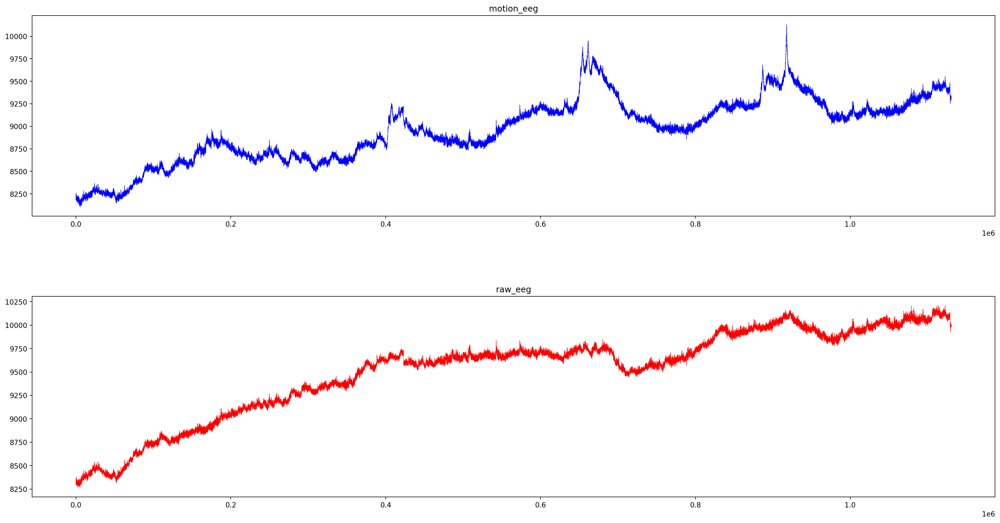

In [7]:
column_x = "sample_index"
column_y1 = "motion_eeg"  #this might be the other way and so i need to clarify this
column_y2 = "raw_eeg"


fig, axes = plt.subplots(nrows=2, ncols=1, dpi=200, figsize=(24, 12))

axes[0].plot(df[column_x],df[column_y1],linestyle='-',color='b',linewidth=0.5)
axes[0].set_title(f'{column_y1}')
# axes[0]

axes[1].plot(df[column_x],df[column_y2],linestyle='-',color='r',linewidth=0.5)
axes[1].set_title(f'{column_y2}')


plt.subplots_adjust(left=0.1, bottom=0.1, 
                    right=0.9, top=0.9, 
                    wspace=0.4, hspace=0.4)
plt.show()

STEP: Robust detrending

In [8]:
def remove_baseline_drift(signal, order=3):
    """
    Removes baseline drift using polynomial curve fitting.
    
    Parameters:
        signal (numpy array): The input EEG or fNIRS signal.
        order (int): The polynomial order for baseline fitting (default: 3).
    
    Returns:
        corrected_signal (numpy array): The detrended signal.
        baseline (numpy array): The estimated baseline.
    """
    t = np.arange(len(signal))  # Time indices
    coeffs = np.polyfit(t, signal, order)  # Fit polynomial of given order
    baseline = np.polyval(coeffs, t)  # Evaluate polynomial baseline
    corrected_signal = signal - baseline  # Subtract baseline

    return corrected_signal, baseline

In [9]:
df[column_y1],_ = remove_baseline_drift(df[column_y1])
df[column_y2],_ = remove_baseline_drift(df[column_y2])


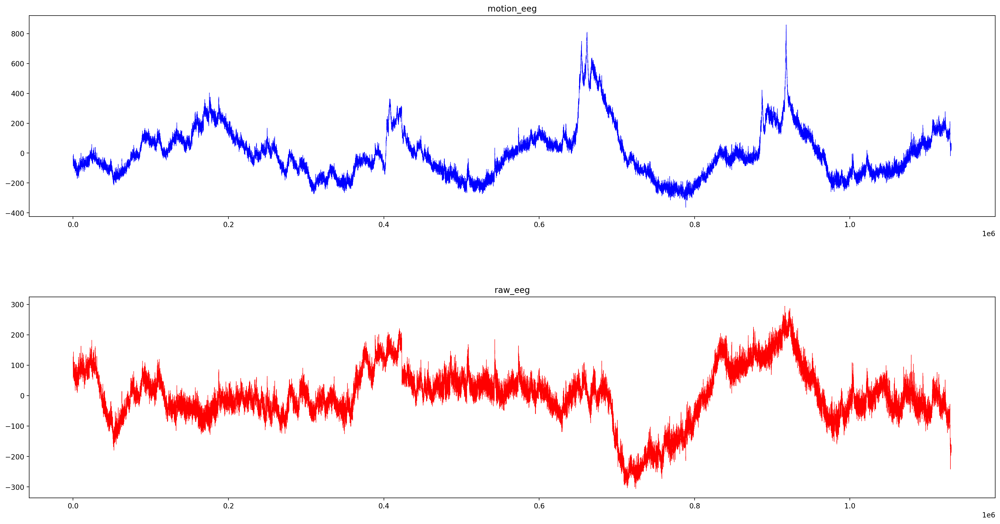

In [10]:
column_x = "sample_index"
column_y1 = "motion_eeg"
column_y2 = "raw_eeg"

fig, axes = plt.subplots(nrows=2, ncols=1, dpi=200, figsize=(24, 12))


axes[0].plot(df[column_x],df[column_y1],linestyle='-',color='b',linewidth=0.5)
axes[0].set_title(f'{column_y1}')
# axes[0]

axes[1].plot(df[column_x],df[column_y2],linestyle='-',color='r',linewidth=0.5)
axes[1].set_title(f'{column_y2}')


plt.subplots_adjust(left=0.1, bottom=0.1, 
                    right=0.9, top=0.9, 
                    wspace=0.4, hspace=0.4)
plt.show()

# Looks extremely skewed but the scales are different so remember that

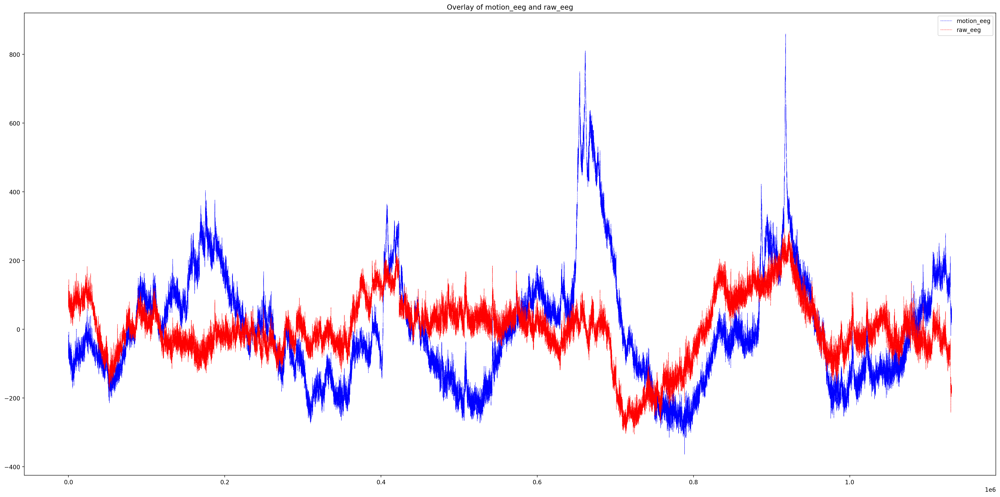

In [11]:
# Create figure and axis
fig, ax = plt.subplots(dpi=200, figsize=(24, 12))

# Plot both lines on the same axis
ax.plot(df[column_x], df[column_y1], linestyle='--', color='b', linewidth=0.5, label=f'{column_y1}')
ax.plot(df[column_x], df[column_y2], linestyle='--', color='r', linewidth=0.5, label=f'{column_y2}')

# Add title and legend
ax.set_title(f'Overlay of {column_y1} and {column_y2}')
ax.legend()

plt.tight_layout()
plt.show()

In [14]:
snr = compute_snr(df[column_y2], df[column_y1])
print(snr)

-5.0340977236381965


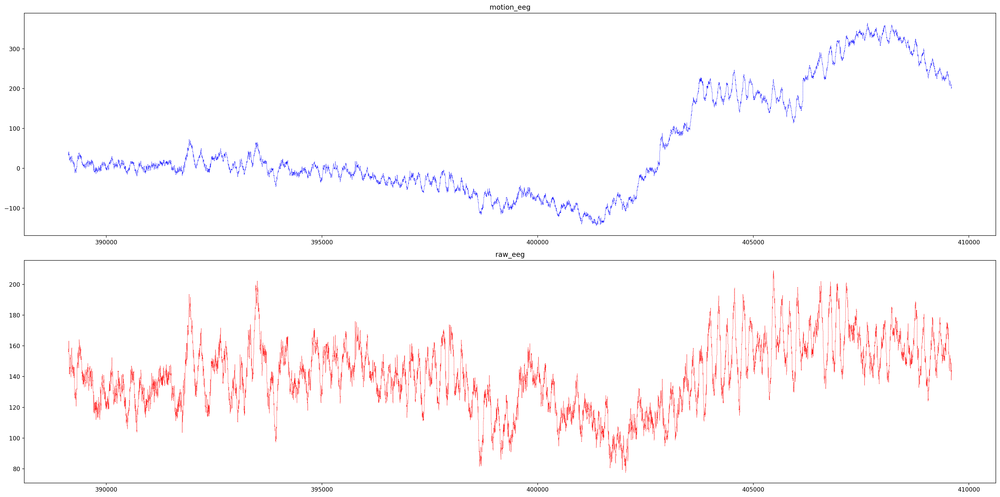

In [12]:
# slice only the first 2048 rows, therefore 1 second
# df = df.iloc[:2048,:]
start, end = get_time_slice(190,200,2048)

fig, axes = plt.subplots(nrows=2, ncols=1, dpi=200, figsize=(24, 12))
axes[0].plot(df[column_x].iloc[start:end],df[column_y1].iloc[start:end],linestyle='--',color='b',linewidth=0.5)
axes[0].set_title(f'{column_y1}')
# axes[0]

axes[1].plot(df[column_x].iloc[start:end],df[column_y2].iloc[start:end],linestyle='--',color='r',linewidth=0.5)
axes[1].set_title(f'{column_y2}')


plt.tight_layout()
plt.show()

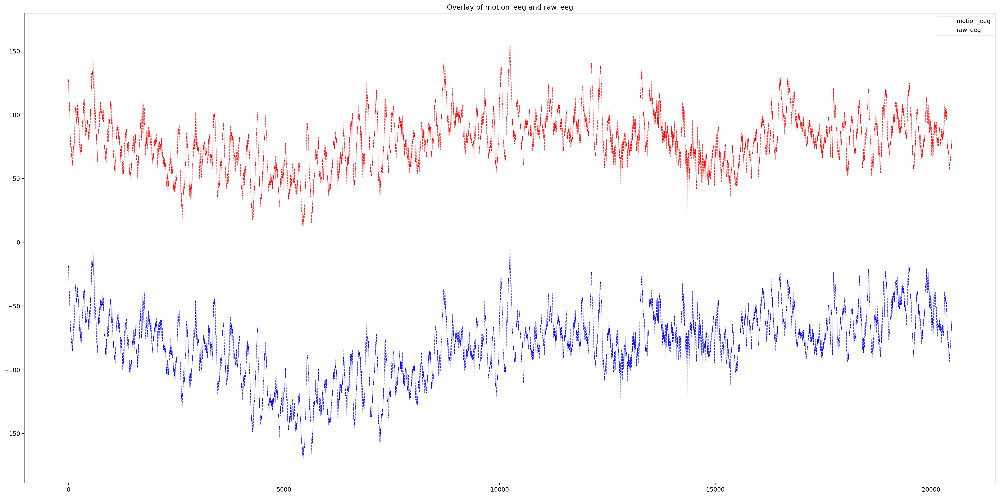

In [13]:
start, end = get_time_slice(0,10,2048)

# Create figure and axis
fig, ax = plt.subplots(dpi=200, figsize=(24, 12))

# Plot both lines on the same axis
ax.plot(df[column_x].iloc[start:end], df[column_y1].iloc[start:end], linestyle='--', color='b', linewidth=0.5, label=f'{column_y1}')
ax.plot(df[column_x].iloc[start:end], df[column_y2].iloc[start:end], linestyle='--', color='r', linewidth=0.5, label=f'{column_y2}')
# ax.plot(df[column_x].iloc[start:end], clean_signal.flatten()[start:end], linestyle='--', color='g', linewidth=0.5, label=f'filtered data')
# ax.plot(df[column_x].iloc[start:end], filtered_data[0][start:end], linestyle='--', color='g', linewidth=0.5, label=f'filtered data')

# Add title and legend
ax.set_title(f'Overlay of {column_y1} and {column_y2}')
ax.legend()

plt.tight_layout()
plt.show()

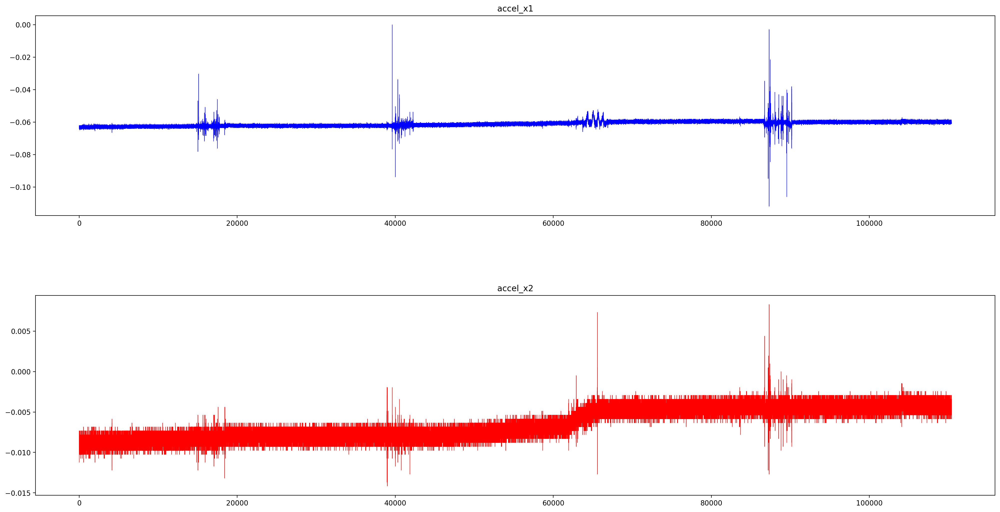

In [14]:
column_x = "sample_index"
column_y1 = "accel_x1"
column_y2 = "accel_x2"

# get total accel
start, end = get_time_slice(0,552,200)

fig, axes = plt.subplots(nrows=2, ncols=1, dpi=200, figsize=(24, 12))

axes[0].plot(df[column_x].iloc[start:end],df[column_y1].iloc[start:end],linestyle='-',color='b',linewidth=0.5)
axes[0].set_title(f'{column_y1}')
# axes[0]

axes[1].plot(df[column_x].iloc[start:end],df[column_y2].iloc[start:end],linestyle='-',color='r',linewidth=0.5)
axes[1].set_title(f'{column_y2}')


plt.subplots_adjust(left=0.1, bottom=0.1, 
                    right=0.9, top=0.9, 
                    wspace=0.4, hspace=0.4)
plt.show()

In [15]:
total_time = len(df)/2048
print(total_time)

552.0


In [16]:
snr = compute_snr(df[column_y2], df[column_y1])
print(snr)

-5.034192783603293


STEP: Movement Denoising

High Pass Filter

In [19]:
# https://medium.com/@ChanakaDev/low-pass-high-pass-and-band-pass-filters-with-scipy-python-a87b2332ce25
cutoff_freq = 0.2
sampling_rate = 2048
order = 3
# Design the high-pass filter (change btype to 'highpass')
nyq = 0.5 * sampling_rate
normal_cutoff = cutoff_freq / nyq
b, a = butter(order, normal_cutoff, btype='highpass', analog=False)


# Apply the filter
df[column_y1] = filtfilt(b, a, df[column_y1])
df[column_y2] = filtfilt(b, a, df[column_y2])

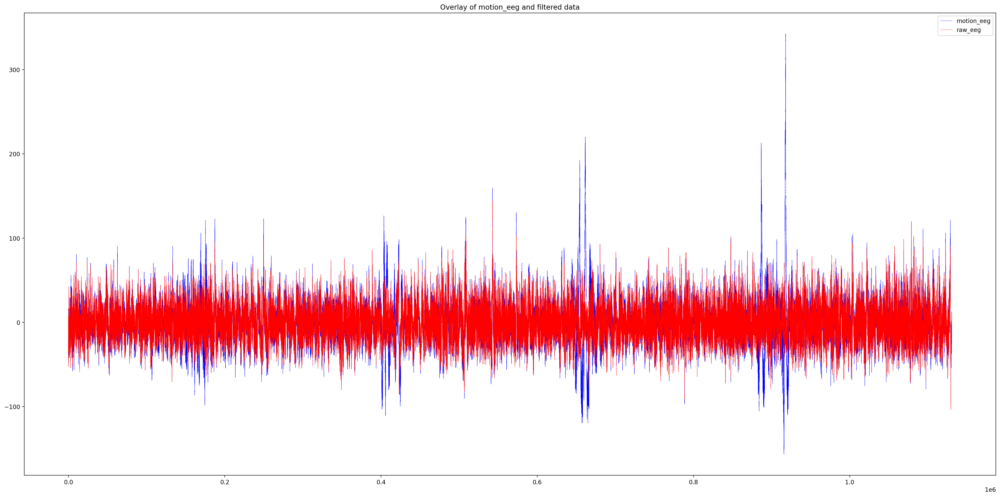

In [20]:
column_x = "sample_index"
column_y1 = "motion_eeg"
column_y2 = "raw_eeg"


# Create figure and axis
fig, ax = plt.subplots(dpi=200, figsize=(24, 12))

# Plot both lines on the same axis
ax.plot(df[column_x], df[column_y1], linestyle='--', color='b', linewidth=0.5, label=f'{column_y1}')
ax.plot(df[column_x], df[column_y2], linestyle='--', color='r', linewidth=0.5, label=f'{column_y2}')


# Add title and legend
ax.set_title(f'Overlay of {column_y1} and filtered data')
ax.legend()

plt.tight_layout()
plt.show()

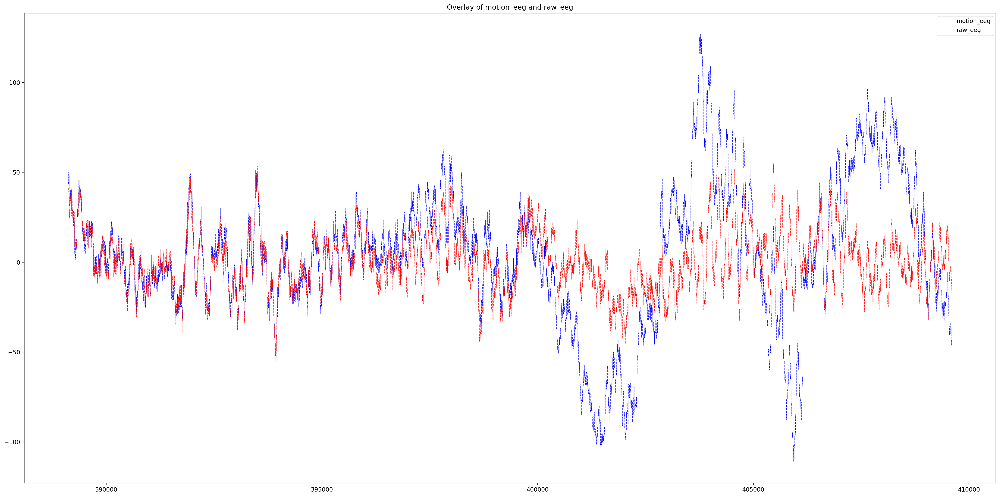

In [21]:
start, end = get_time_slice(190,200,2048)

# Create figure and axis
fig, ax = plt.subplots(dpi=200, figsize=(24, 12))

# Plot both lines on the same axis
ax.plot(df[column_x].iloc[start:end], df[column_y1].iloc[start:end], linestyle='--', color='b', linewidth=0.5, label=f'{column_y1}')
ax.plot(df[column_x].iloc[start:end], df[column_y2].iloc[start:end], linestyle='--', color='r', linewidth=0.5, label=f'{column_y2}')

# Add title and legend
ax.set_title(f'Overlay of {column_y1} and {column_y2}')
ax.legend()

plt.tight_layout()
plt.show()

In [20]:
snr = compute_snr(df[column_y2], df[column_y1])
print(snr)

-5.034192783603293


Another method: VMD-CCA

In [16]:
def filter_extreme_peaks(freqs, psd, threshold=95):
    """
    Removes extreme PSD peaks above a certain percentile.
    """
    cutoff = np.percentile(psd, threshold)  # Get 95th percentile value
    valid_indices = psd <= cutoff  # Keep only reasonable peaks
    return freqs[valid_indices], psd[valid_indices]

def initialize_omega_psd(signal, K):
    """
    Initialize omega using the dominant frequencies of the signal,
    with extreme peak filtering.
    """
    freqs, psd = welch(signal, nperseg=len(signal)//8)
    freqs, psd = filter_extreme_peaks(freqs, psd)
    
    # Select top-K dominant frequencies
    dominant_freqs = freqs[np.argsort(psd)[-K:]]
    return np.sort(dominant_freqs)

In [20]:
# Variational Mode Decomposition (VMD)
def VMD(signal, alpha=200, tau=0, K=3, DC=0, init=1, tol=1e-6):
    signal = np.asarray(signal)  # Ensure it's a NumPy array
    N = len(signal)
    
    # Frequency domain
    freq = np.arange(1, N + 1) / N - 0.5 - (1 / N) * np.mod(N, 2)
    
    # Initialization
    u = np.zeros((K, N))  # Modes
    omega = initialize_omega_psd(signal, K)  # Use filtered peak frequencies
    omega += np.random.uniform(-0.05, 0.05, size=omega.shape)

#     np.linspace(0, 0.5, K)  # Center frequencies
    lambda_hat = np.zeros(N, dtype=complex)  # Lagrange multiplier (complex)
    
    # Transform to Fourier domain
    f_hat = fft(signal)
    
    u_hat = np.zeros((K, N), dtype=complex)
    
    iter_count = 0
    omega_old = np.copy(omega)
    print("reached loop")
    while True:
        for k in range(K):
            sum_u_hat = np.sum(u_hat, axis=0) - u_hat[k]
            residual = f_hat - sum_u_hat - lambda_hat / 2
            
            # Update u_hat[k]
            u_hat[k] = residual / (1 + alpha * (freq - omega[k]) ** 2)
            
            # Update omega[k]
            omega[k] = np.sum(np.abs(freq) * np.abs(u_hat[k]) ** 2) / np.sum(np.abs(u_hat[k]) ** 2)
        if iter_count % 10 == 0:
            print(f"Iteration {iter_count}: omega = {omega}")

        # Update lambda_hat
        lambda_hat += tau * (np.sum(u_hat, axis=0) - f_hat)
#         print(f"lambda_hat: {lambda_hat}")
        # Check convergence
        if np.linalg.norm(omega - omega_old) < tol:
            print("converged")
            break
        
        omega_old = np.copy(omega)
        iter_count += 1
    
    # Compute final modes
    for k in range(K):
        u[k] = np.real(ifft(u_hat[k]))
    
    return u

# Canonical Correlation Analysis (CCA) for Denoising
def CCA_denoise(modes, num_components=1):
    cca = CCA(n_components=num_components)
    X1, X2 = modes[:-1], modes[1:]
    cca.fit(X1.T, X2.T)
    cleaned_signal = cca.transform(X1.T, X2.T)[0].T
    return cleaned_signal



# Example usage
def process_eeg(signal):
    modes = VMD(signal, K=5)  # Decompose into 4 modes
    for i, mode in enumerate(modes):
        print(f"Mode {i}: mean={np.mean(mode)}, std={np.std(mode)}, max={np.max(mode)}, min={np.min(mode)}")
    for i in range(modes.shape[0]):
        modes[i] = (modes[i] - np.mean(modes[i])) / (np.std(modes[i]) + 1e-8)

    clean_signal = CCA_denoise(modes)  # Denoise using CCA
    print(f"Original signal: mean={np.mean(signal)}, std={np.std(signal)}")
    print(f"Clean signal (before scaling): mean={np.mean(clean_signal)}, std={np.std(clean_signal)}, max={np.max(clean_signal)}, min={np.min(clean_signal)}")
    # Get robust statistics from noisy input
    estimated_mean, estimated_std = robust_stats(signal)


    
    # Scale using the estimated clean signal statistics
    clean_signal = (clean_signal- np.mean(clean_signal)) / (np.std(clean_signal) + 1e-8)
    clean_signal = clean_signal * estimated_std + estimated_mean

    print(f"Final Clean Signal: mean={np.mean(clean_signal)}, std={np.std(clean_signal)}")



    return clean_signal, modes

In [18]:
def robust_stats(signal):
    """Compute robust mean & scale using median and MAD."""
    median = np.median(signal)
    mad = np.median(np.abs(signal - median)) * 1.4826  # Convert MAD to std estimate
    return median, mad

In [19]:
clean_signal, modes = process_eeg(df[column_y1])

reached loop
Iteration 0: omega = [0.46518616 0.48942204 0.492369   0.49364109 0.49426907]
Iteration 10: omega = [0.49794819 0.4975885  0.44251631 0.49407268 0.48929501]
Iteration 20: omega = [0.49805658 0.49769972 0.44085582 0.48838943 0.48285789]
Iteration 30: omega = [0.49813405 0.49771126 0.43561814 0.48123037 0.47365389]
Iteration 40: omega = [0.49818807 0.49768453 0.42689816 0.47632978 0.46526663]
Iteration 50: omega = [0.49820989 0.49762219 0.41443237 0.4753708  0.45936667]
Iteration 60: omega = [0.49822501 0.49753568 0.40025825 0.47647734 0.45515306]
Iteration 70: omega = [0.49824672 0.49743638 0.38894029 0.47734367 0.45221856]
Iteration 80: omega = [0.49827317 0.49733785 0.38302859 0.47752913 0.45038581]
Iteration 90: omega = [0.49830125 0.49724509 0.38053438 0.47745867 0.44906843]
Iteration 100: omega = [0.49832981 0.49715516 0.37939406 0.4773165  0.44802106]
Iteration 110: omega = [0.49835867 0.49706518 0.37873713 0.4771575  0.44716585]
Iteration 120: omega = [0.4983879  0.4

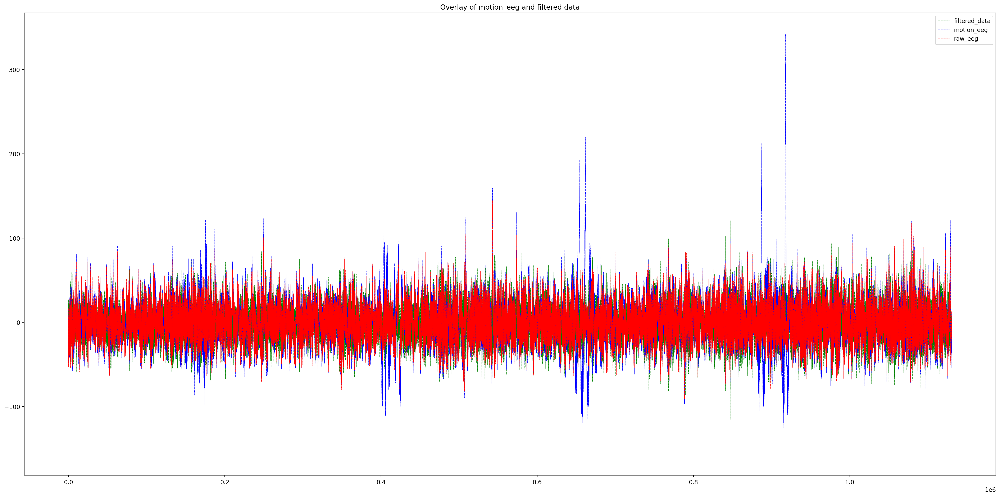

In [21]:
column_x = "sample_index"
column_y1 = "motion_eeg"
column_y2 = "raw_eeg"


# Create figure and axis
fig, ax = plt.subplots(dpi=200, figsize=(24, 12))

# Plot both lines on the same axis
# ax.plot(df[column_x], df[column_y1], linestyle='--', color='b', linewidth=0.5, label=f'{column_y1}')


ax.plot(df[column_x], clean_signal.flatten(), linestyle='--', color='g', linewidth=0.5, label=f'filtered_data')
ax.plot(df[column_x], df[column_y1], linestyle='--', color='b', linewidth=0.5, label=f'{column_y1}')
ax.plot(df[column_x], df[column_y2], linestyle='--', color='r', linewidth=0.5, label=f'{column_y2}')


# Add title and legend
ax.set_title(f'Overlay of {column_y1} and filtered data')
ax.legend()

plt.tight_layout()
plt.show()

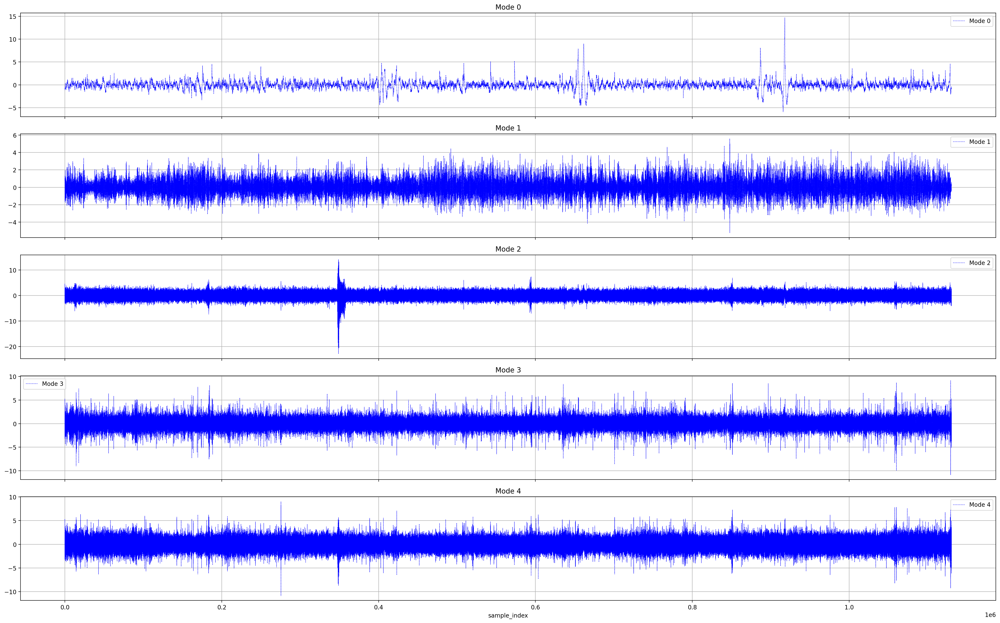

In [26]:
column_x = "sample_index"

# Create figure and axes for subplots
fig, axes = plt.subplots(nrows=len(modes), sharex=True, figsize=(24, 3 * len(modes)), dpi=200)



# Plot each mode in its respective subplot
for i, ax in enumerate(axes):
    ax.plot(df[column_x], modes[i], linestyle='--', color='b', linewidth=0.5, label=f'Mode {i}')
    ax.set_title(f'Mode {i}')
    ax.legend()
    ax.grid(True)

# Label x-axis only on the last subplot
axes[-1].set_xlabel(column_x)

plt.tight_layout()
plt.show()

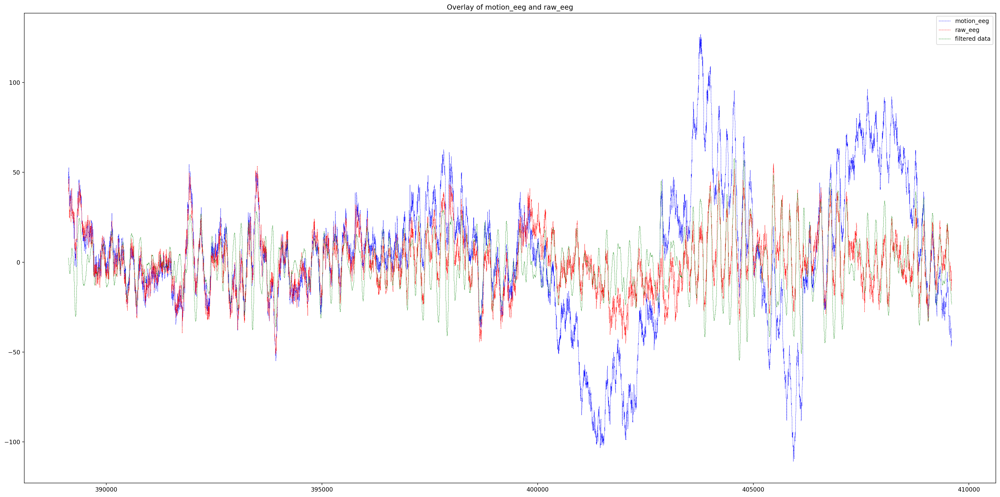

In [23]:
start, end = get_time_slice(190,200,2048)

# Create figure and axis
fig, ax = plt.subplots(dpi=200, figsize=(24, 12))

# Plot both lines on the same axis
ax.plot(df[column_x].iloc[start:end], df[column_y1].iloc[start:end], linestyle='--', color='b', linewidth=0.5, label=f'{column_y1}')
ax.plot(df[column_x].iloc[start:end], df[column_y2].iloc[start:end], linestyle='--', color='r', linewidth=0.5, label=f'{column_y2}')
ax.plot(df[column_x].iloc[start:end], clean_signal.flatten()[start:end], linestyle='--', color='g', linewidth=0.5, label=f'filtered data')

# Add title and legend
ax.set_title(f'Overlay of {column_y1} and {column_y2}')
ax.legend()

plt.tight_layout()
plt.show()

In [27]:
snr = compute_snr(df[column_y2], clean_signal.flatten())
print(snr)

2.968505316721042
